# The Reverse Diffusion for image processing 

#### In this notebook, we show how an explicit reverse diffusion process, via the reverse Brownian motion - theoretically equivalent to the reverse heat equation - can be used for image corruption, restoration and compression. 

##### We demonstrate the process on three very different types of images: satellite; cartoon; architectural. 

##### The semigroup and diffusion notebooks are structured in the same manner. It may be interesting to compare the notebooks side by side.

We remark the the Brownian motion we are concerned with is the Brownian motion on all of Euclidean space, not limited to the square. Hence this Brownian motion is equivalent to the Euclidean heat kernel, not the heat kernel on a square which is approximated by the Jacobi-Theta function.

### Satellite image

Let us import an image 

In [1]:
from heatdiff import load_image, show_image
from heatdiff.image import normalize_image

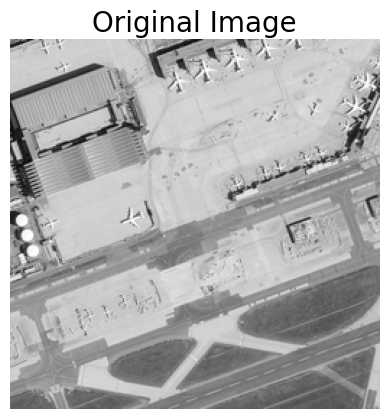

In [2]:
original_img = load_image("images/dop20_32_468_5543_1_he.jpg")
normalised_img = normalize_image(original_img)
show_image(original_img, "Original Image")

Now, we apply the reverse diffusion for 10000 steps. Note that the larger the number of steps, the better the approximation to the reverse Brownian motion and hence a better performance. 

Note that for the diffusion process, we first need to normalise the image.

In [3]:
from heatdiff.processing import reverse_diffusion

In [4]:
stl_rev, stl_fwd = reverse_diffusion(normalised_img, 1, 10000)

Let's take a look at how the image is corrupted and then reconstructed. We visualise the first few steps and the final step. Note that the larger the number of steps, the lower the mean squared error between the original image and its reconstruction. Note that for the reconstruction process, the 0th image is the final step. (The diffusion process is 'slower' than the comparison heat semigroup method in the other notebook; however, this can be changed by augmenting the kernel size.)

In [5]:
def plot_images(img, step):
    """
    Plot every k'th image

    Parameters:
    - img (list): input list of images
    - step (int): plot every 'step' size image

    Returns:
    - None: This function displays a plot and does not return any values
    """
    for i in range(0, (len(img)), step):
        show_image(img[i], i)


import matplotlib.pyplot as plt


def subplot_2(image1, image2):
    """
    Plotting two images side by side.

    Parameters:
    - image1 (matrix): matrix representation of an image.
    - image1 (matrix): matrix representation of an image.

    Returns:
    - None: This function displays a plot and does not return any value.
    """
    fig = plt.figure(figsize=(10, 10))

    rows = 2
    columns = 2

    fig.add_subplot(rows, columns, 1)

    plt.imshow(image1, cmap="gray")
    plt.axis("off")
    plt.title("Image 1")

    fig.add_subplot(rows, columns, 2)

    plt.imshow(image2, cmap="gray")
    plt.axis("off")
    plt.title("Image 2")

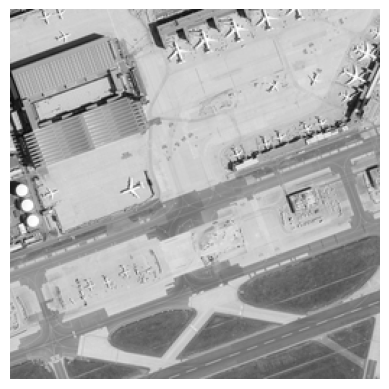

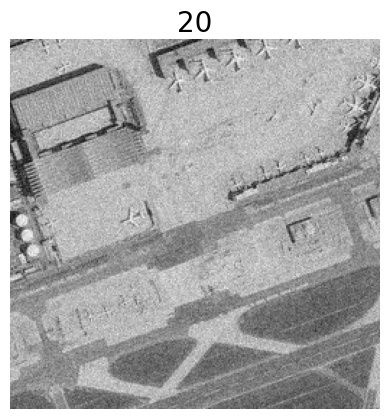

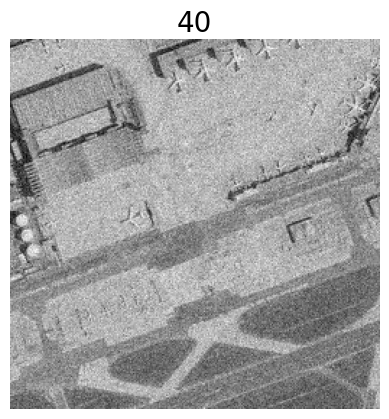

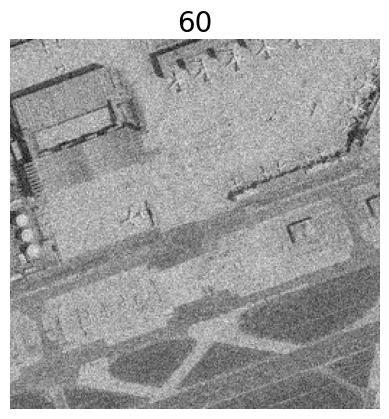

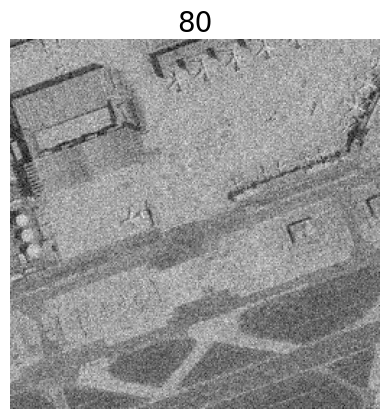

In [6]:
plot_images(stl_fwd[0:100], 20)

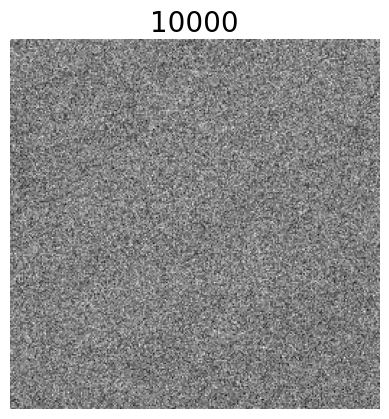

In [7]:
show_image(stl_fwd[-1], "10000")

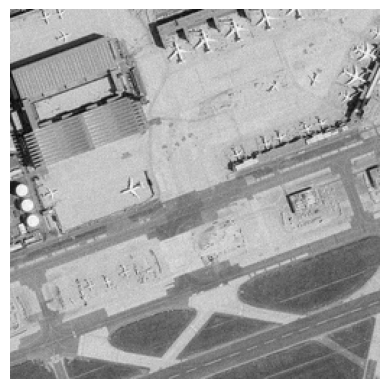

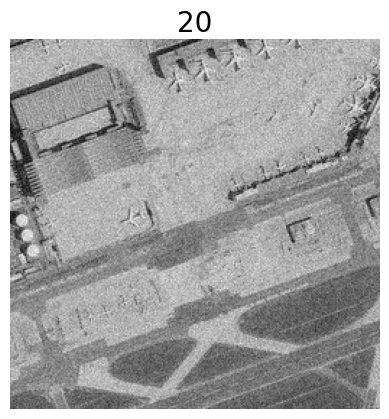

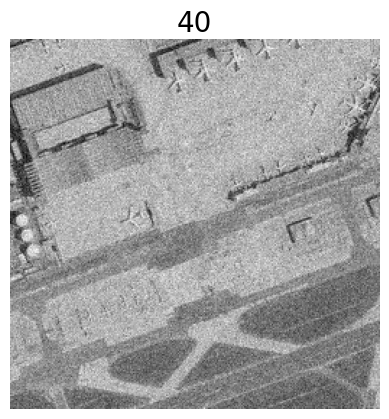

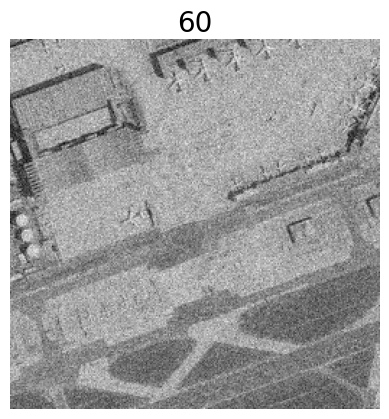

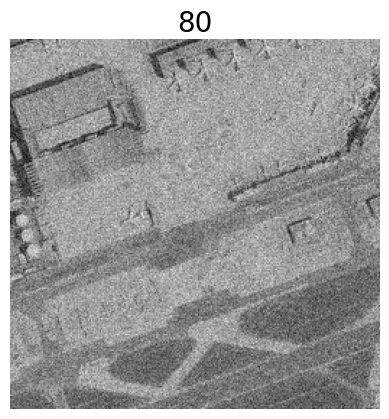

In [8]:
plot_images(stl_rev[0:100], 20)

After putting the reconstructed image into the 0-255 pixel range, let us visually compare the two images and their distributions. 

In [9]:
from heatdiff.image import normal_range
from heatdiff.visualization import compare_norm_histograms

In [10]:
reconstructed_stl = normal_range(stl_rev[0])

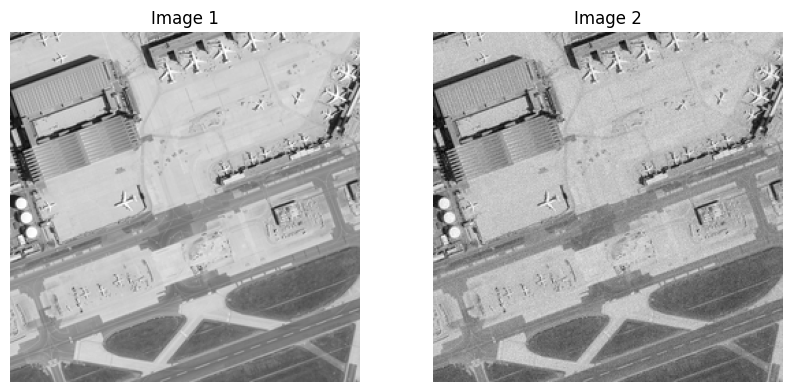

In [11]:
subplot_2(original_img, reconstructed_stl)

We can see that we have lost some of the sharpness of the image

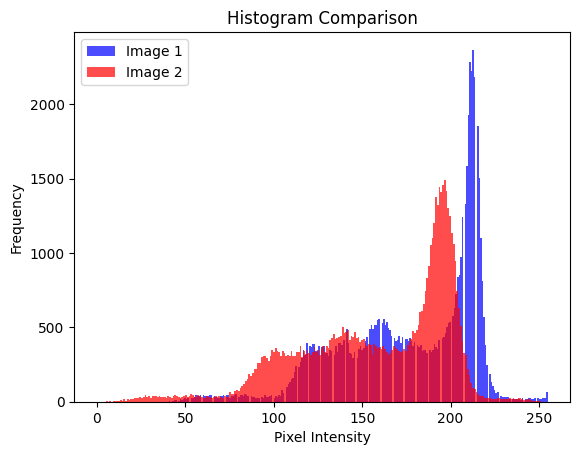

In [12]:
compare_norm_histograms(original_img, reconstructed_stl)

Compared to the semigroup_demo notebook, we see that the reverse diffusion equation tends to 'over-smooth' the original image.  

Now, let us compare the mean square error. We will normalise both images so that it makes for a much more interpretable comparison.

In [13]:
from heatdiff.image.image_metrics import mean_squared_error as mse

In [14]:
mse(
    normalised_img, normalize_image(reconstructed_stl)
) * 100  # To have it as a percentage

0.13522738658953556

As previously stated, increasing the number of steps greatly decreases the mean squared error as well as the visual loss. 

### Compression 

We will use a weighted K-means to compress the image. We do this by reducing the range of pixel intensity from 256 to 8 (random choice.) The weight in the K-means algorithm is the Hermite polynomial of order 0, which approximates the normal distribution to zeroth order. Note that the Normal distribution is equivalent to the transition probability at a fixed time (equivalent to the heat kernel at a fixed time), since time = variance.

In [15]:
from heatdiff.image import hermite_compression

In [16]:
compressed_stl, centres = hermite_compression(reconstructed_stl, 8)

In [17]:
compressed_stl = normal_range(compressed_stl)

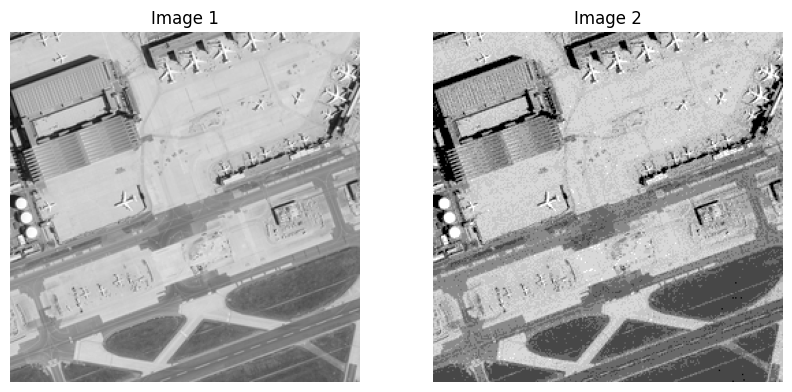

In [18]:
subplot_2(original_img, compressed_stl)

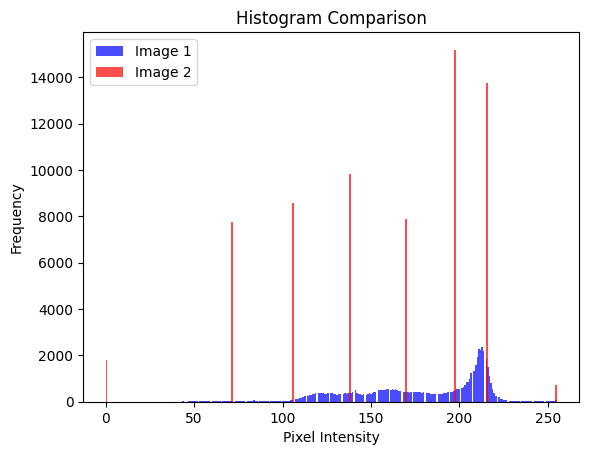

In [19]:
compare_norm_histograms(original_img, compressed_stl)

Lets check the mean squared error. 

In [20]:
(
    mse(normalised_img, normalize_image(reconstructed_stl)) * 100,
    mse(normalised_img, normalize_image(compressed_stl)) * 100,
)

(0.13522738658953556, 0.5229387913174381)

Next, we can investigate the number of bits that we have saved per pixel. This is done via the Shannon Entropy 

In [21]:
import skimage.measure

In [22]:
entropy_orig = skimage.measure.shannon_entropy(original_img)
entropy_compressed_markus = skimage.measure.shannon_entropy(compressed_stl)

entropy_orig, entropy_compressed_markus

(6.806117226509501, 2.7023818396172645)

### Cartoon image

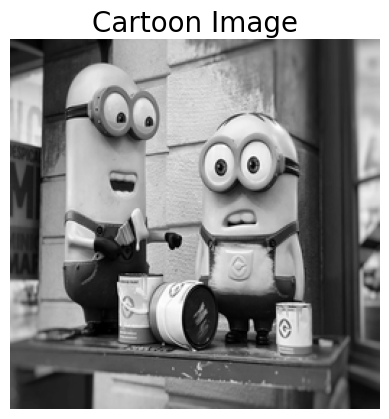

In [23]:
cartoon_img = load_image("images/justin-lim-tloFnD-7EpI-unsplash.jpg")
cartoon_normal = normalize_image(cartoon_img)
show_image(cartoon_img, "Cartoon Image")

In [24]:
cartoon_rev, cartoon_fwd = reverse_diffusion(cartoon_normal, 1, 10000)

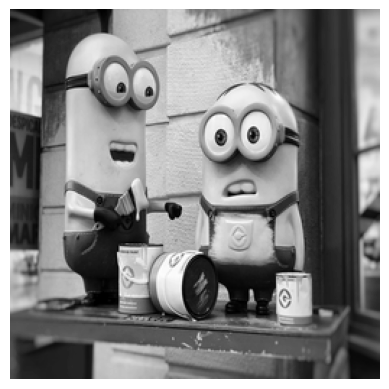

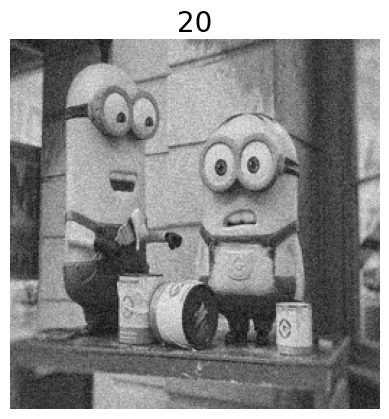

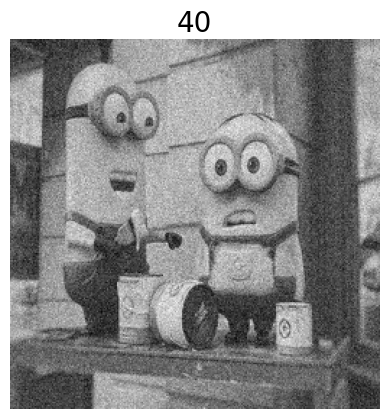

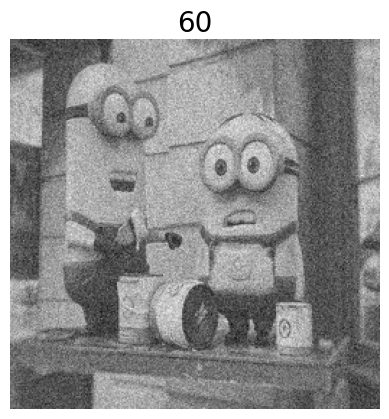

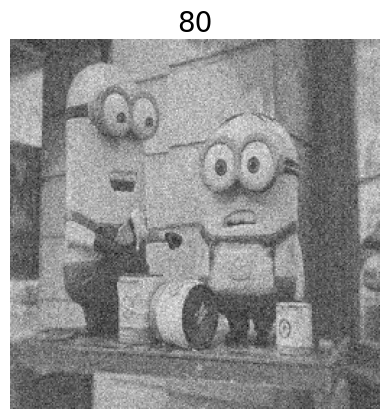

In [25]:
plot_images(cartoon_fwd[0:100], 20)

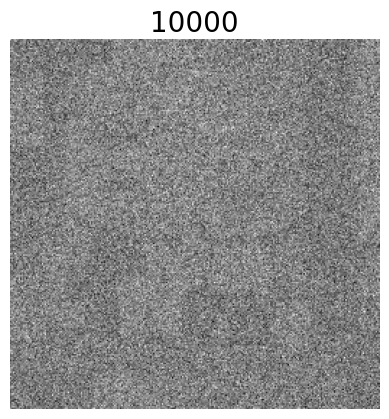

In [26]:
show_image(cartoon_fwd[-1], "10000")

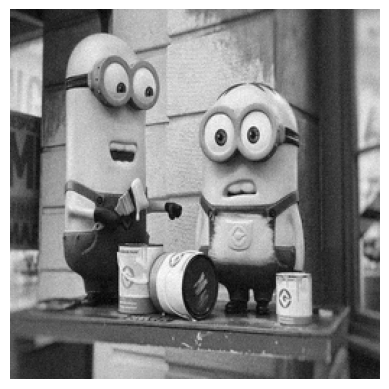

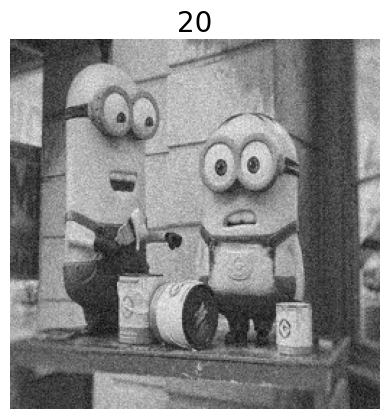

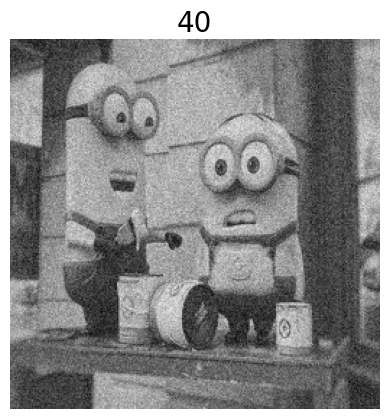

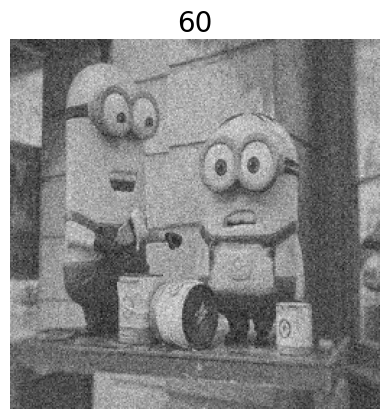

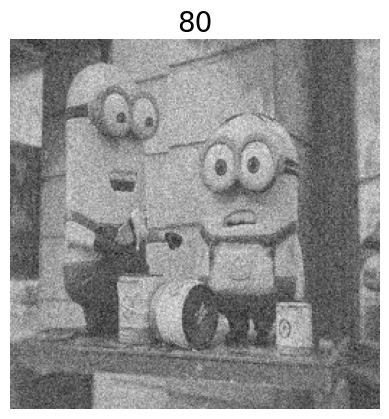

In [27]:
plot_images(cartoon_rev[0:100], 20)

In [28]:
reconstructed_cartoon = normal_range(cartoon_rev[0])

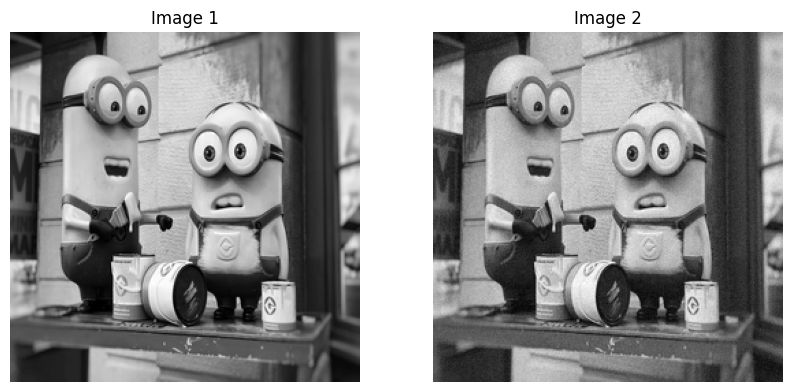

In [29]:
subplot_2(cartoon_img, reconstructed_cartoon)

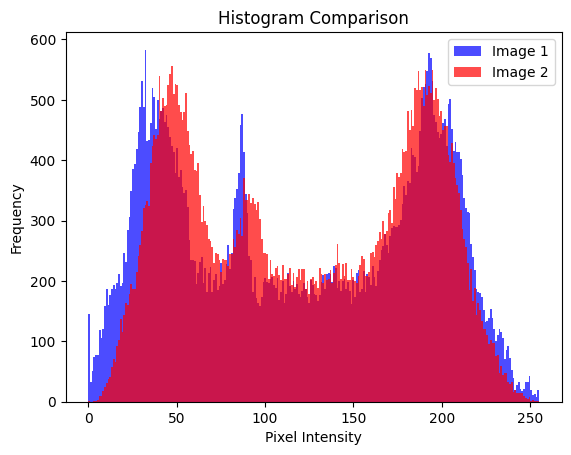

In [30]:
compare_norm_histograms(cartoon_img, reconstructed_cartoon)

In [31]:
mse(cartoon_normal, normalize_image(reconstructed_cartoon)) * 100

0.09742435864511245

In [32]:
compressed_cartoon, centres_1 = hermite_compression(reconstructed_cartoon, 8)

In [33]:
compressed_cartoon = normal_range(compressed_cartoon)

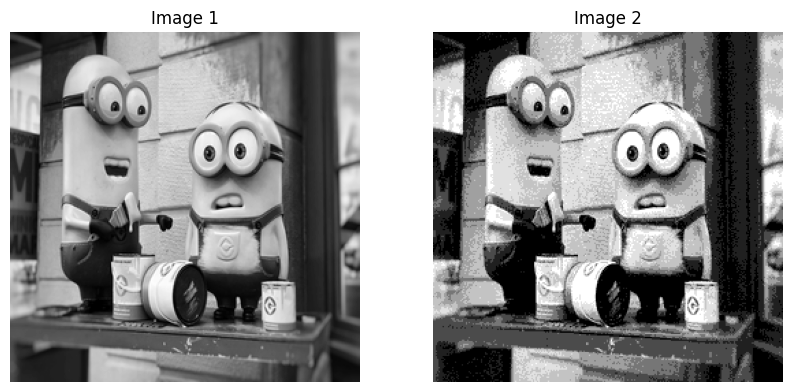

In [34]:
subplot_2(cartoon_img, compressed_cartoon)

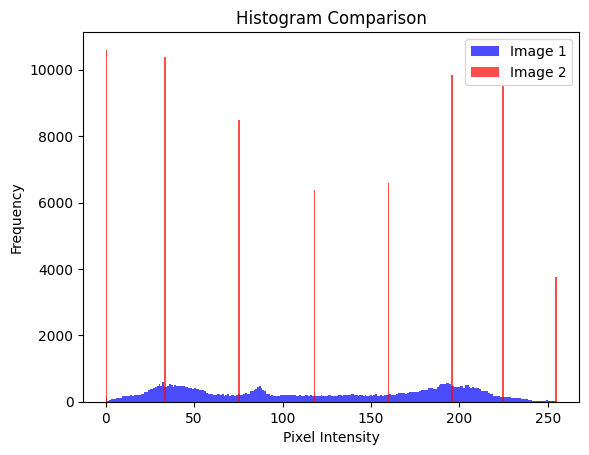

In [35]:
compare_norm_histograms(cartoon_img, compressed_cartoon)

In [36]:
entropy_cartoon = skimage.measure.shannon_entropy(cartoon_img)
entropy_compressed_cartoon = skimage.measure.shannon_entropy(compressed_cartoon)

entropy_cartoon, entropy_compressed_cartoon

(7.788976965715208, 2.9396512212237993)

In [37]:
(
    mse(cartoon_normal, normalize_image(reconstructed_cartoon)) * 100,
    mse(cartoon_normal, normalize_image(compressed_cartoon)) * 100,
)

(0.09742435864511245, 0.6128680600610342)

### Architecture image (fewer steps)

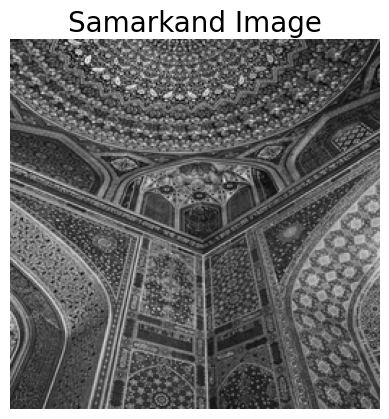

In [38]:
samarkand_img = load_image("images/axp-photography-GQ1fXkYGS40-unsplash.jpg")
samarkand_normal = normalize_image(samarkand_img)
show_image(samarkand_img, "Samarkand Image")

In [ ]:
samarkand_rev, samarkand_fwd = reverse_diffusion(samarkand_normal, 1, 1000)

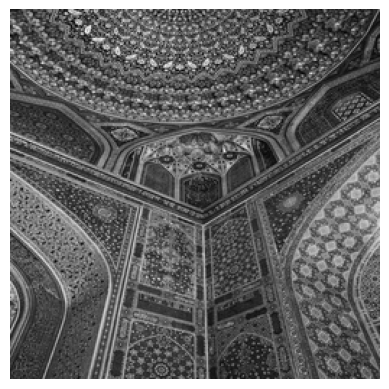

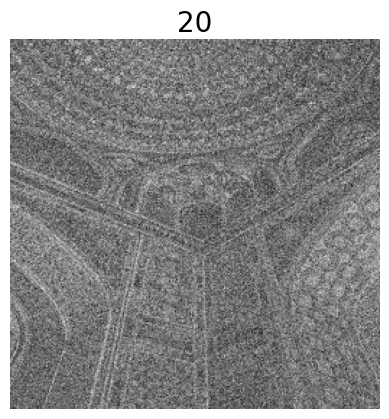

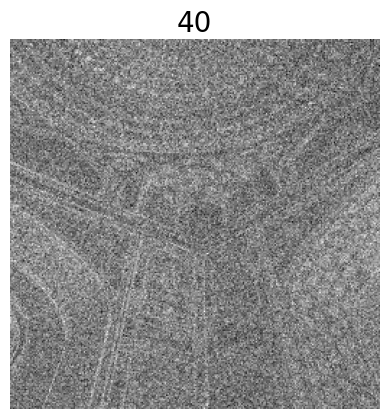

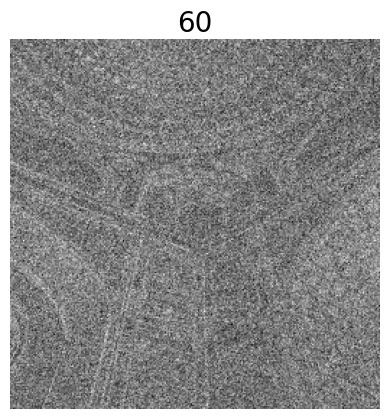

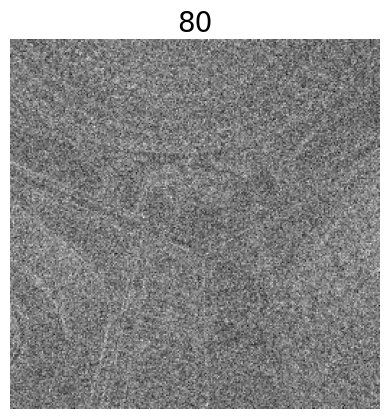

In [ ]:
plot_images(samarkand_fwd[0:100], 20)

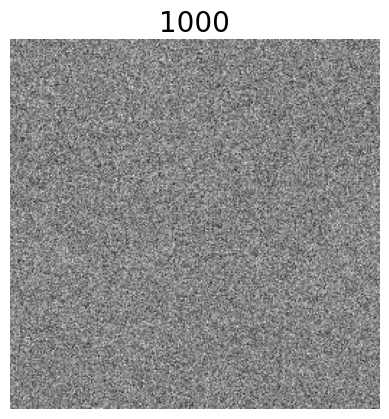

In [ ]:
show_image(samarkand_rev[-1], "1000")

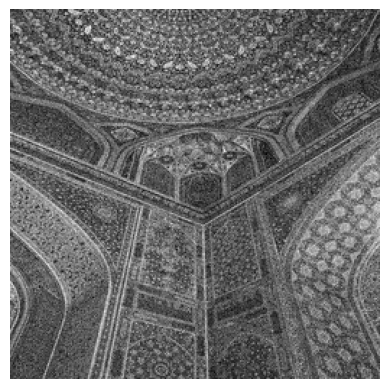

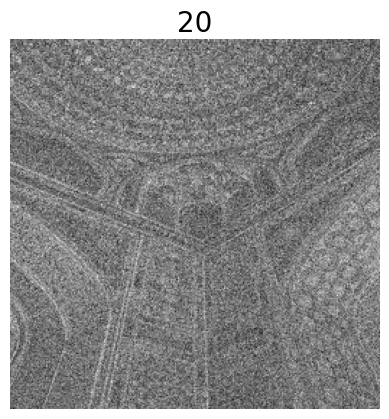

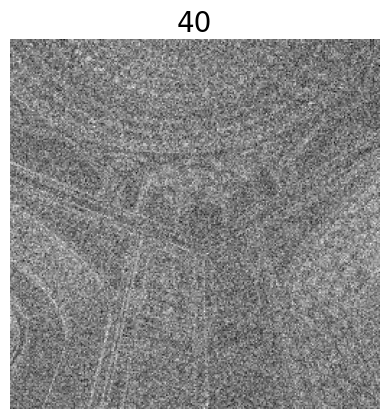

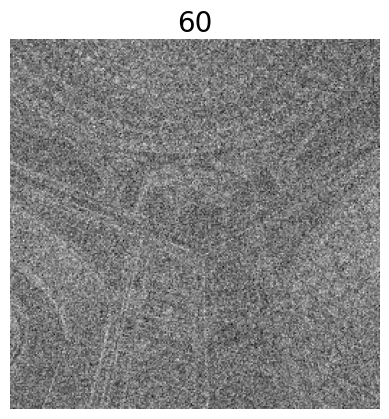

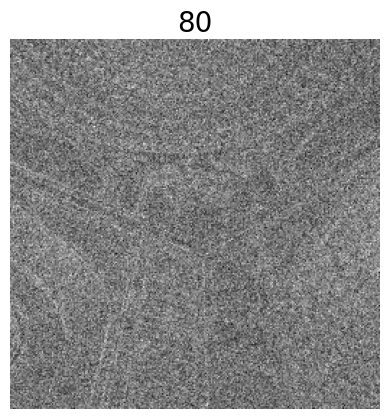

In [ ]:
plot_images(samarkand_rev[0:100], 20)

In [ ]:
reconstructed_samarkand = normal_range(samarkand_rev[0])

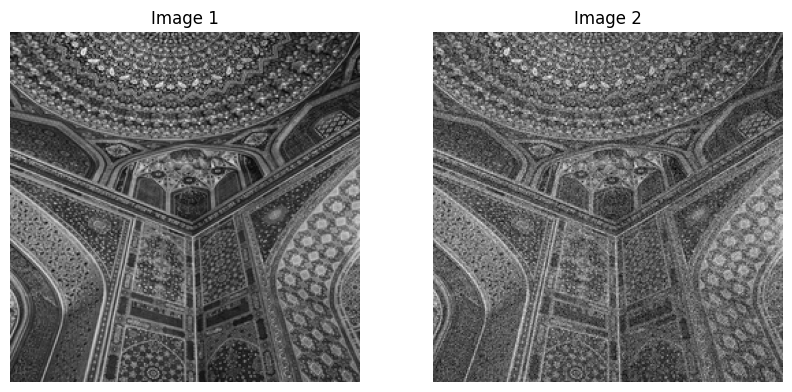

In [ ]:
subplot_2(samarkand_img, reconstructed_samarkand)

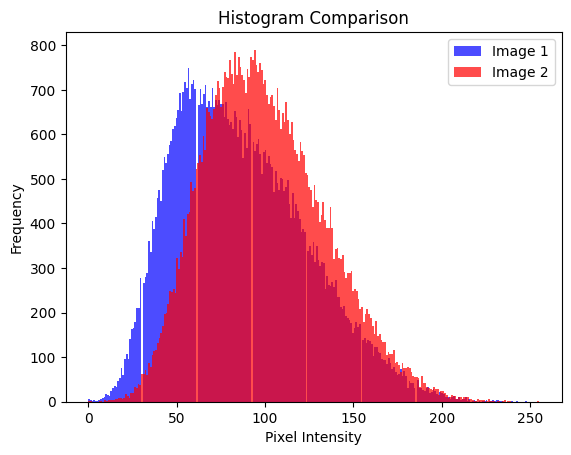

In [ ]:
compare_norm_histograms(samarkand_img, reconstructed_samarkand)

In [ ]:
mse(samarkand_normal, normalize_image(reconstructed_samarkand))

np.float64(0.0052553798530563835)

In [ ]:
compressed_samarkand, centres = hermite_compression(reconstructed_samarkand, 8)

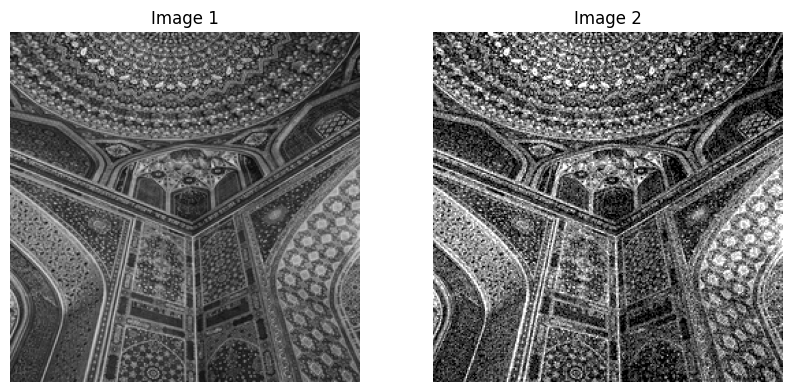

In [ ]:
subplot_2(samarkand_img, compressed_samarkand)

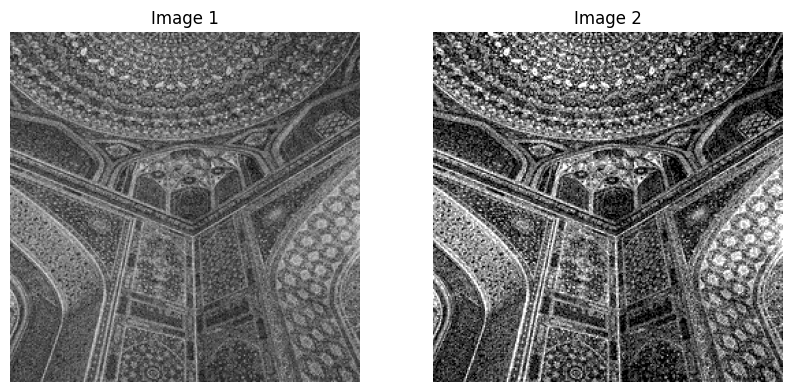

In [ ]:
subplot_2(reconstructed_samarkand, compressed_samarkand)

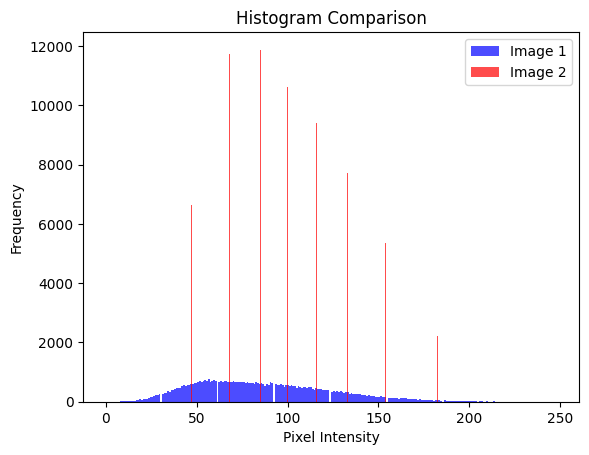

In [ ]:
compare_norm_histograms(samarkand_img, compressed_samarkand)

In [ ]:
(
    mse(samarkand_normal, normalize_image(compressed_samarkand)),
    mse(samarkand_normal, normalize_image(reconstructed_samarkand)),
)

(np.float64(0.017886717525029034), np.float64(0.0052553798530563835))